In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from keras import applications, preprocessing, utils, models

Using TensorFlow backend.


载入我们要测试的图片

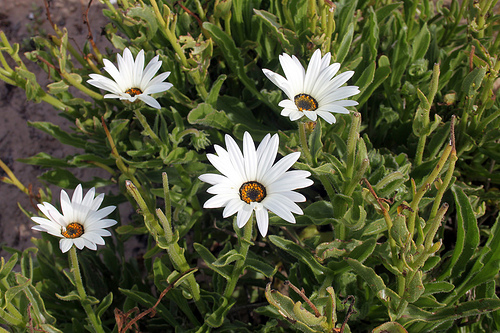

In [2]:
img_path = './data/train/daisy/10993818044_4c19b86c82.jpg'
Image.open(img_path)

In [3]:
img = np.array(preprocessing.image.load_img(img_path, target_size=(224, 224)), dtype=np.float32)
img = applications.vgg16.preprocess_input(img)
img = np.expand_dims(img, axis=0)
img.shape

(1, 224, 224, 3)

载入之前训练的模型。

In [4]:
model_json = open('./model/model.json', 'rt').read()
model = models.model_from_json(model_json)
model.load_weights('./model/model.h5')

In [5]:
conv_base = model.layers[1]
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

提取所有conv激活输出层

In [6]:
layers_outputs = [layer.output for layer in conv_base.layers if 'conv' in layer.name]
inputs = conv_base.inputs

In [7]:
activation_model = models.Model(inputs, layers_outputs)

使用我们的激活预测模型

In [8]:
activations = activation_model.predict(img)

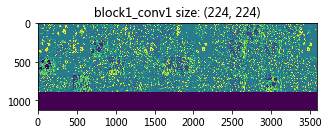

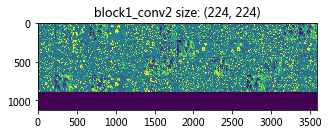

/home/liuminggao/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


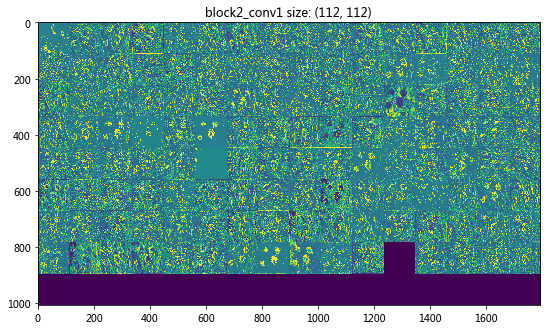

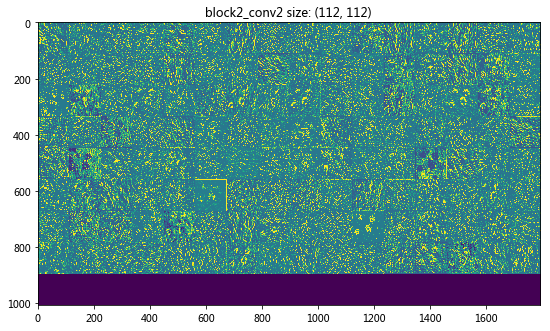

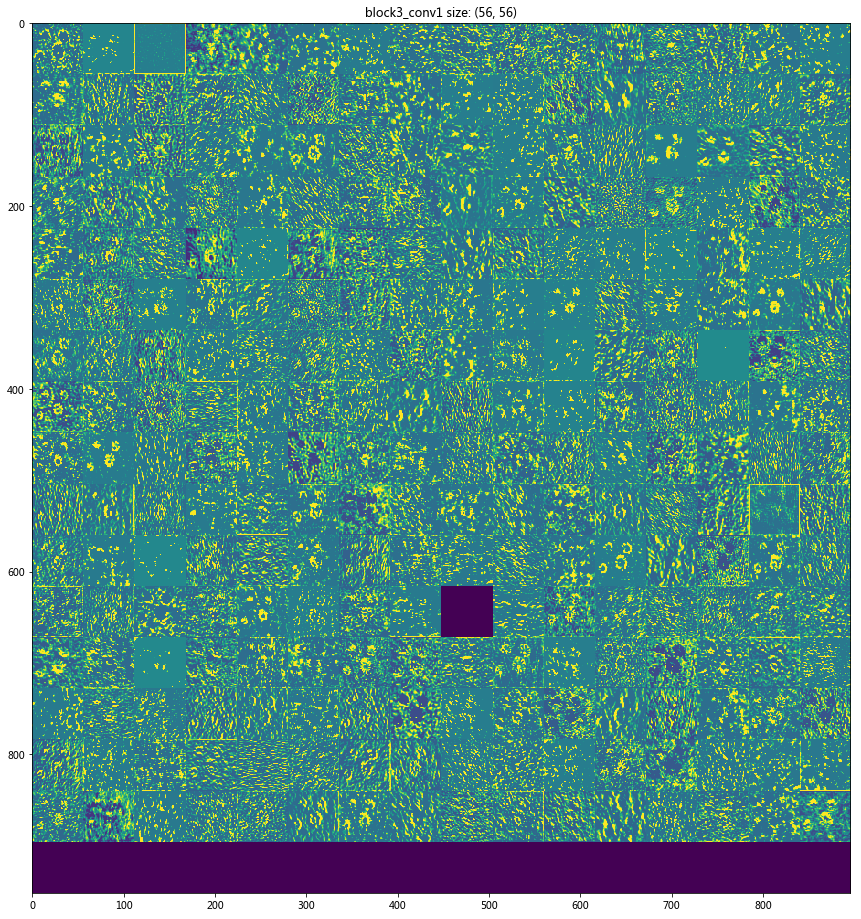

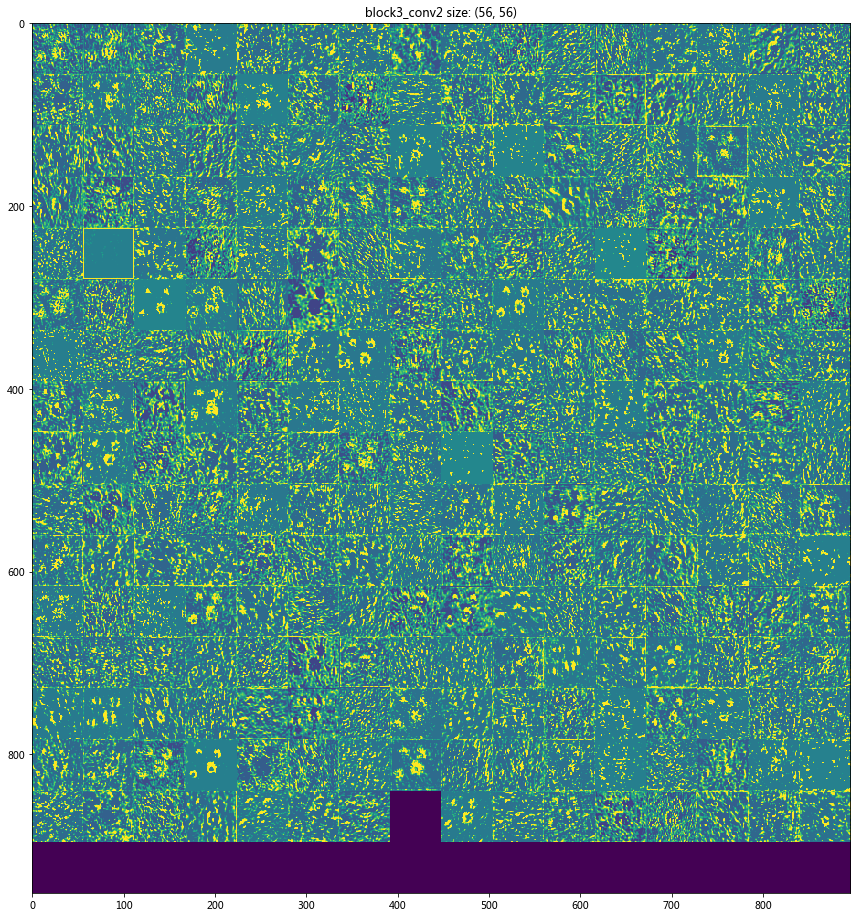

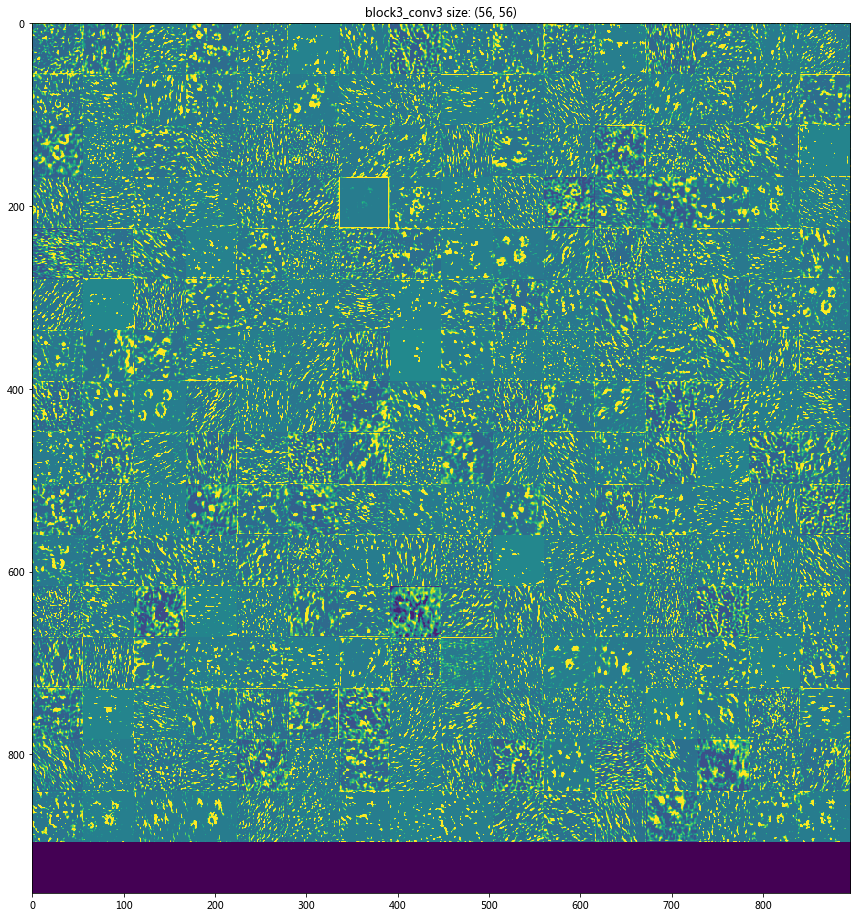

...

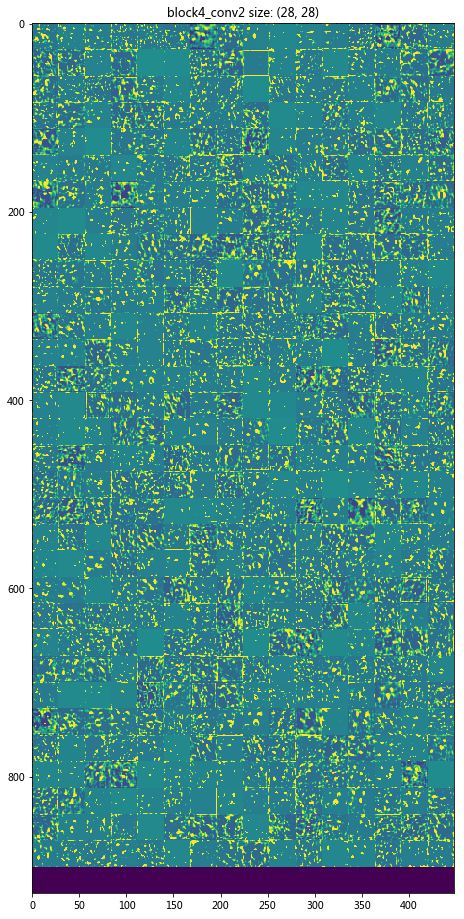

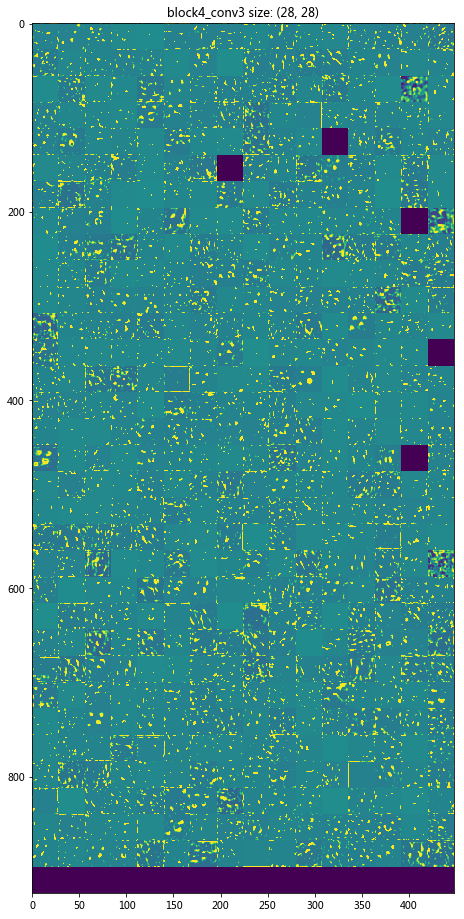

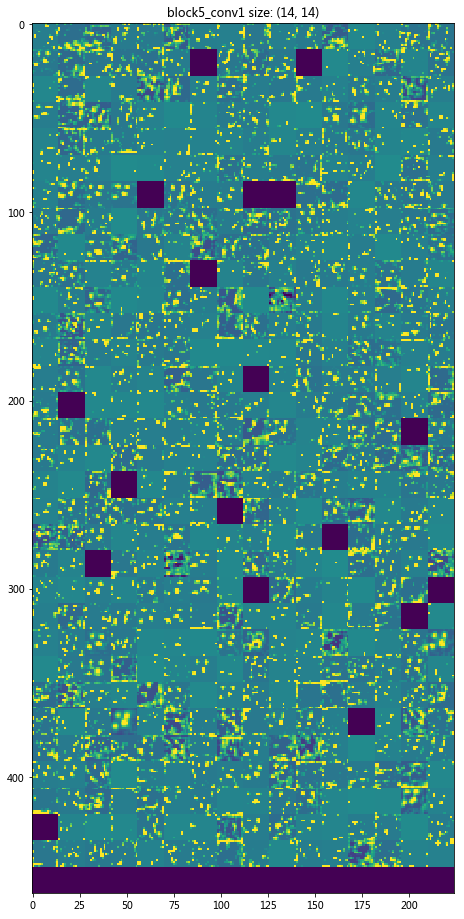

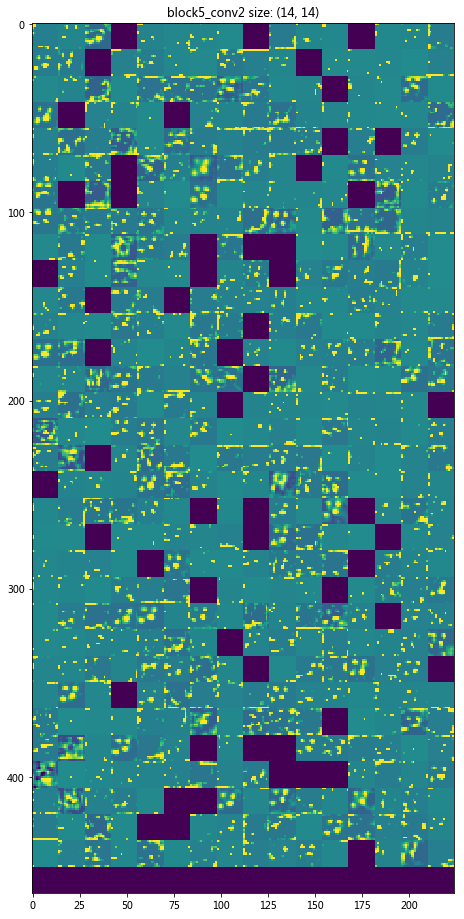

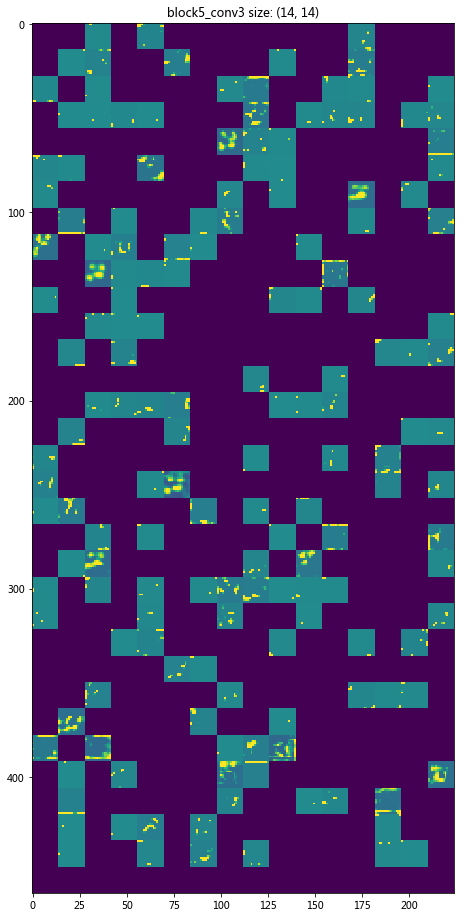

In [11]:
# 获取每个layer的name
layer_names = [layer.name for layer in conv_base.layers if 'conv' in layer.name]
image_per_row = 16

for name, activation in zip(layer_names, activations):
    n_features = activation.shape[-1]
    size = activation.shape[1]

    n_cols = image_per_row
    n_rows = n_features // n_cols + 1
    
    display_grid = np.zeros((n_rows * size, n_cols * size))
    for row in range(n_rows):
        for col in range(n_cols):
            idx = n_cols * row + col
            if idx >= n_features:
                break
            # 后处理特征
            channel_image = activation[0, :, :, idx]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[row * size: (row + 1) * size, col * size: (col + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(display_grid.shape[0] * scale, display_grid.shape[1] * scale))
    plt.imshow(display_grid)
    plt.title(name + ' size: ({}, {})'.format(size, size))
    plt.grid(False)
    plt.xticks
    plt.show()

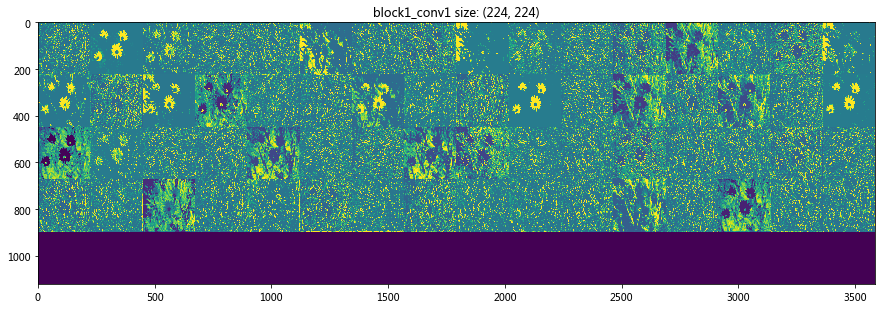

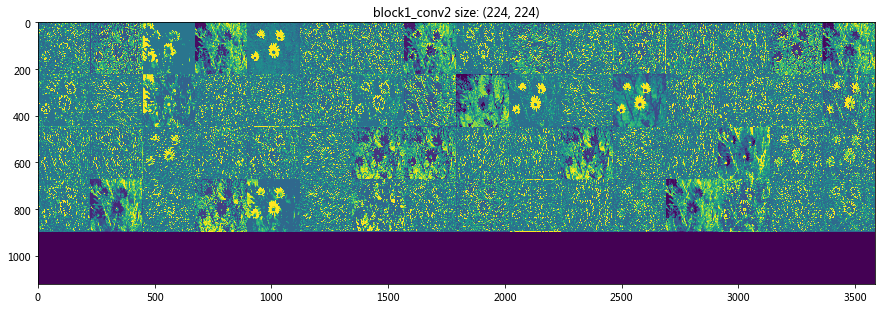

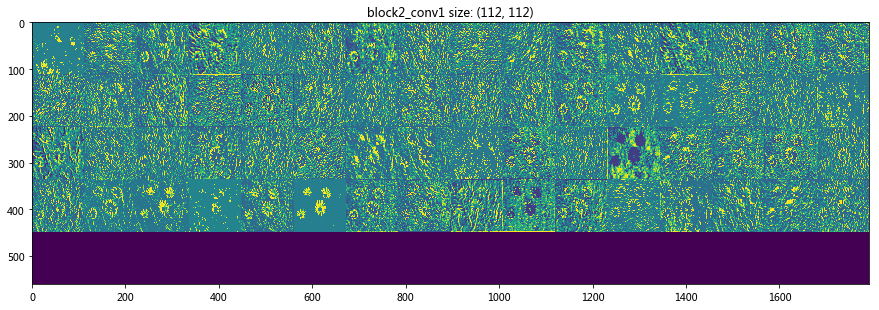

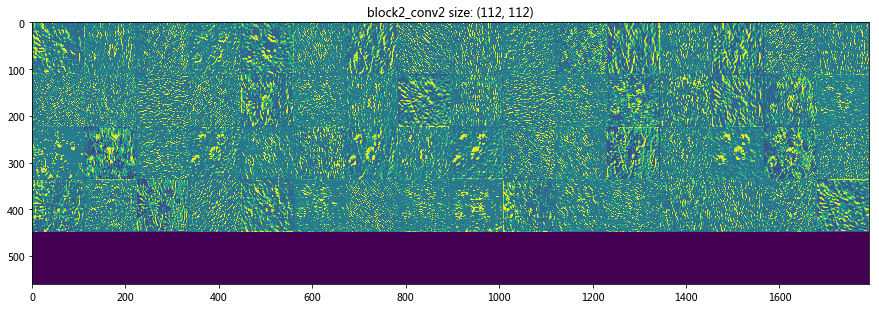

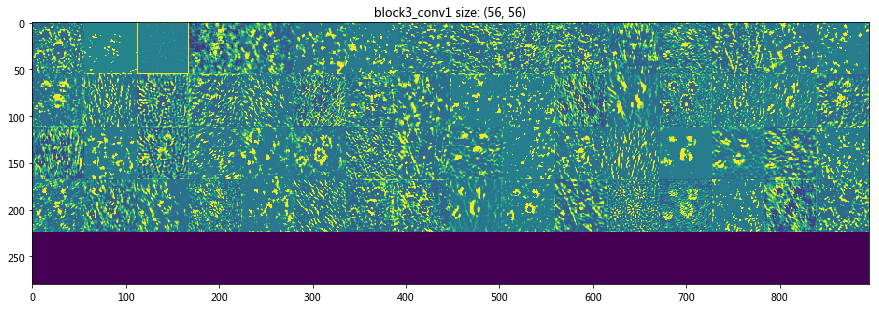

...

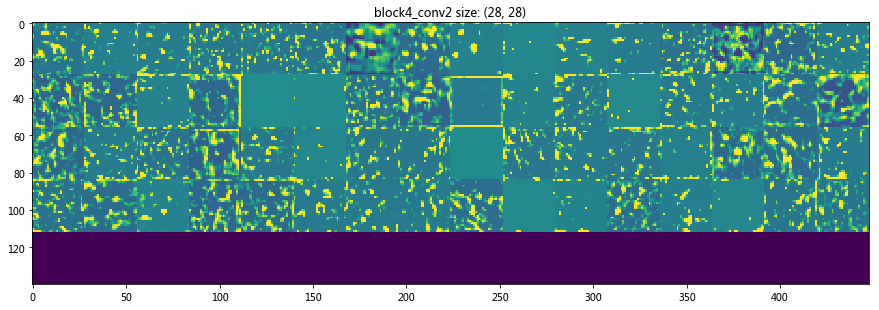

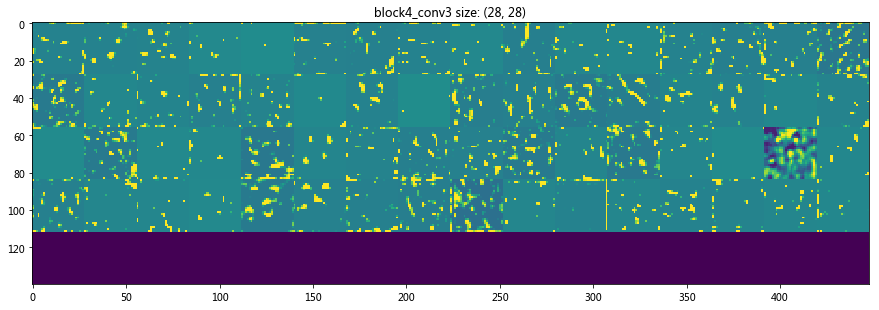

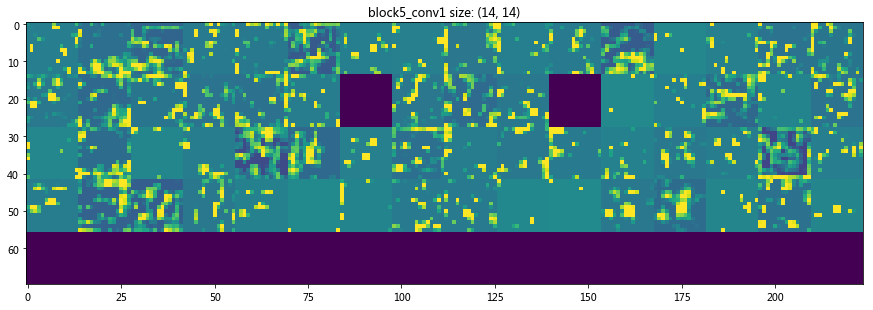

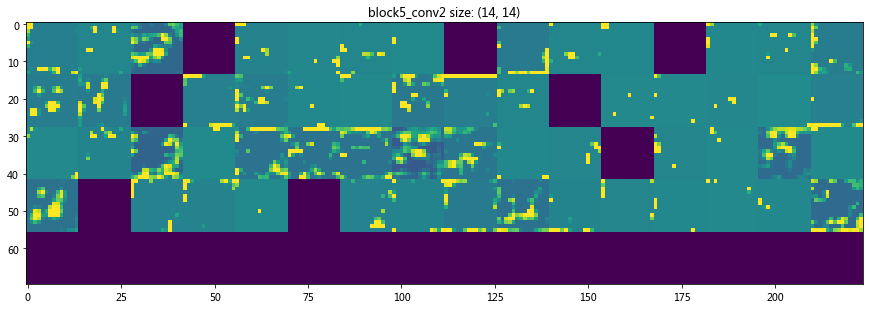

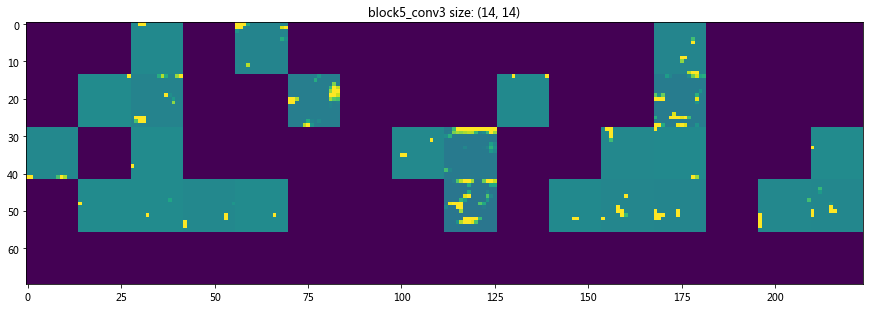

In [10]:
# 获取每个layer的name
layer_names = [layer.name for layer in conv_base.layers if 'conv' in layer.name]
image_per_row = 16

for name, activation in zip(layer_names, activations):
    n_features = min(activation.shape[-1], 64)
    size = activation.shape[1]

    n_cols = image_per_row
    n_rows = n_features // n_cols + 1
    
    display_grid = np.zeros((n_rows * size, n_cols * size))
    for row in range(n_rows):
        for col in range(n_cols):
            idx = n_cols * row + col
            if idx >= n_features:
                break
            # 后处理特征
            channel_image = activation[0, :, :, idx]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[row * size: (row + 1) * size, col * size: (col + 1) * size] = channel_image
    
    plt.figure(figsize=(15, 15))
    plt.imshow(display_grid)
    plt.title(name + ' size: ({}, {})'.format(size, size))
    plt.grid(False)
    plt.xticks
    plt.show()